# Spatial Processing and Analysis Pipeline

## Directory/File Paths

Define sample ID and certain input/output directory/file paths.

**Data**
* `panel_id`: Define the Xenium panel ID (e.g., TUQ97N for Helmsley senescence, XR4UZH for liver/PSC-IBD).
* `libid_original`: The original LabKey sample ID.
* `libid`: The sample ID you want to use for the sample (should be `libid_original` or a single <condition label with no special characters>-<libid_original>, e.g., `Uninflamed-50403A2`, NOT `uinflamed-special-2-50403`).
* `run_id`: The Xenium run ID for the sample (e.g., "CHO-011"), which is the sub-directory samples for that run are stored in.
* `dir_sample`: Lowest level Xenium data sub-directory for the sample's onboard analyzer output. 
  
These variables are used to define standardized input and output file paths, includingj, for instance, the full path to the Xenium onboard analyzer sample data directory (`dir_oba`, defined below: `dir_xenium` > `panel_id` > `run_id` > `dir_sample`).

**NFS/Writeable Directories**
* `dir_xenium`: Define the path to the Xenium panel data. Change it to match your compute environment. Refer to `Data Path (Red = PHI)` column of the table in the ["Compute Environments" section on the "Compute" page on Confluence (click here)](https://mssm-ipm.atlassian.net/wiki/spaces/cholab/pages/857047077/Compute#Environments) for the appropriate entry directory (in this case, `/mnt/cho_lab` for Spark). Refer to the [NFS directory section of that page](https://mssm-ipm.atlassian.net/wiki/spaces/cholab/pages/857047077/Compute#Network-File-System---NFS) for the data sub-directory. For Minimus, it's `/mnt/data1/cache/nfs-data-registries/xenium-registry/outputs`.
* `reg_tiss`: Path to the tissue registry.
* `dir_user`: Path to a writeable directory which should contain the subdirectory path `f"outputs/{panel_id}/nebraska"`, where objects and other saved results are stored.

**Output**
* `out_dir`: Top-level directory for output (e.g., objects and, in sub-directories, marker files, Xenium Explorer cluster files, plots, etc.). Set to None to not write output.
* `out_pre`: Where to pull past outputs from. `out_dir` is for what you're about to write by running this notebook (if `out_dir` is not None), but you may want to pull prior objects from elsewhere and not write new ones, or you may want to re-load an object processed by someone else originally and stored in their folder, but you want to re-cluster the object, annotate it, analyze it downstream, etc. and store it in your own folder. You'd specify `out_pre` as their folder and `out_dir` as your folder.

**Image Files**
* `image_type`: NO SPECIAL CHARACTERS. Will be the name of the image in the `spatialdata` object (e.g., `self.adata.images["he"]`), and should be the sub-directory of the panel tissue registry where the sub-directories `raw`, `ome-tiff`, and `aligment` are.
* `file_image`: Path to the `.ome.tiff` image (converted from `.ndpi`).
* `file_alignment`: Path to the image alignment `keypoints.csv` file for the sample/image (exported from Xenium Explorer).

**Extras**
* `file_whole_tx`: Path to the processed object `.h5ad` for adjacent-section whole transcriptome for imputation onto spatial data.
* `file_ann`: Path to an automated marker-based annotation guide (see annotation section).
* `col_ann` and `col_a` are the columns of cell type labels to use in `file_ann` and `file_a`, respectively. 

****
**Click this drop-down for code to find the appropriate path (`dir_oba`) to your sample's data automatically!**
<details>
  <summary>Click here for code.</summary>
  
  ```python
  import corescpy as cr

  # Define Sample ID, Panel ID, Metadata File Path, etc.
  libid = "50336C"
  panel_id = "TUQ97N"
  direc = "/mnt/cho_lab/bb-xenium-registry"
  path_metadata = str("/mnt/cho_lab/disk2/elizabeth/data/shared-xenium-library/"
                      f"samples_{panel_id}.csv")
  cap_id = True if panel_id == "TUQ97N" else False  # uppercase ID for TUQ97N

  # Find Data Path Automatically
  metadata = cr.pp.get_metadata_cho(
      direc, path_metadata, samples=libid, path_col_only=True,
      panel_id=panel_id, capitalize_sample=cap_id)  # metadata
  dir_oba = metadata.iloc[0]  # data path
  libid = metadata.index.values[0]  # newly-constructed sample ID
  print(libid, "\n", dir_oba)
  ```
</details>

### Imports and File Path Options

In [1]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os
import re
import functools
import pandas as pd
import corescpy as cr

# Sample/Data Paths
panel_id = "TUQ97N"
run_id, libid, libid_original = "CHO-010", "Uninflamed-50336C", "50336C"
dir_sample = "output-XETG00189__0011047__50336C-TUQ97N-EA__20240422__175051"
col_sample_id = "Sample"  # ideally should reflect appropriate metadata columns"

# Detect Spark versus Minimus & NFS/Registry & Writeable Directory Paths
spark = os.path.exists("/mnt/cho_lab")
dir_xenium = "/mnt/cho_lab/bb-xenium-registry/outputs" if spark else str(
    "/mnt/data1/cache/nfs-data-registries/xenium-registry/outputs")
reg_tiss = os.path.join("/mnt/cho_lab/bb-nfs-data-registries" if (
    spark) else "/mnt/data1/cache/nfs-data-registries", "tissue-registry")
dir_user = os.path.join("/mnt/cho_lab/disk2/elizabeth" if spark else str(
    "/mnt/data1/elizabeth"), "data/shared-xenium-library")

# Output Directory
out_dir = None
out_pre = os.path.join(dir_user, f"outputs/{panel_id}/nebraska")
# out_dir = os.path.join(dir_user, f"outputs/{panel_id}/nebraska")
# out_pre = out_dir

# Image Name/Paths
image_type = "he"
dir_image = os.path.join(reg_tiss, f"xenium/{panel_id}/{image_type}")
file_image = os.path.join(dir_image, f"ome-tiff/{libid}.ome.tif")
file_align = os.path.join(dir_image, f"alignment/{libid}/matrix.csv")  # align

# Extras
file_whole_tx = os.path.join(out_pre, f"objects_scrna/{libid}_scrna.h5ad")
# file_whole_tx = None  # don't impute adjacent-section whole tx'ome
file_ann = os.path.join(os.path.expanduser("~"),
                        "corescpy/examples/markers_lineages.csv")
col_ann = "group"  # cell type label column in `file_ann`
file_a = os.path.join(out_pre, "annotation_dictionaries/annotations_all.xlsx")
col_a = "lump"  # cell type label column in `file_a`

### Construct Standardized Input/Output Paths`

`dir_oba`: Xenium onboard analyzer sample data directory: `dir_xenium` > `panel_id` > `run_id` > `dir_sample`.

For instance, `/mnt/cho_lab/bbdata2/outputs/XR4UZH/CHO-014/output-XETG00189__0033935__1014A2-XR4UZH-JH__20240617__193846`.

In [2]:
# Paths
dir_oba = os.path.join(dir_xenium, panel_id, run_id, dir_sample)
in_obj = os.path.join(out_pre, f"{libid}.h5ad")
if out_dir not in [None, False]:
    out_obj = os.path.join(out_dir, f"{libid}.h5ad")  # for object .h5ad file
    out_markers = os.path.join(out_dir, "find_markers")  # find_markers file
    out_plot = os.path.join(out_dir, "plots", libid)  # cluster plots
    [os.makedirs(x, exist_ok=True) for x in [
        out_dir, out_plot, out_markers]]  # make sub-directories if needed
else:
    out_obj, out_markers, out_plot, file_whole_tx = None, None, None, None

# Ensure No Over-Write
if out_obj and os.path.exists(out_obj):
    tmp, out_obj = out_obj, None
    raise ValueError(f"{out_obj} already exists! Will not overwrite.")

## Create Object

Create the raw `coreSCpy` object.

You can update this initial raw object with previously-saved processed object using `self.update_from_h5ad(out_obj)` **AFTER YOU HAVE LOADED ANY IMAGE FILES.**
* In that case, you will almost certainly want to set `kws_pp` (preprocessing parameters) to `None` because the object is already preprocessed. 
* If you wanted to re-preprocess, you'd likely just be working with the raw object anyway and so wouldn't use `self.update_from_h5ad()`.

In [3]:
self = cr.Spatial(dir_oba, library_id=libid, col_sample_id=col_sample_id)



<<< INITIALIZING SPATIAL CLASS OBJECT >>>

INFO     reading                                                                                                   
         /mnt/cho_lab/bb-xenium-registry/outputs/TUQ97N/CHO-010/output-XETG00189__0011047__50336C-TUQ97N-EA__202404
         22__175051/cell_feature_matrix.h5                                                                         


Counts: Initial: table


	Observations: 387961

	Genes: 469







 AnnData object with n_obs × n_vars = 387961 × 469
    obs: 'cell_id', 'transcript_counts', 'control_probe_counts', 'control_codeword_counts', 'unassigned_codeword_counts', 'deprecated_codeword_counts', 'total_counts', 'cell_area', 'nucleus_area', 'region', 'z_level', 'nucleus_count', 'cell_labels', 'Sample'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatialdata_attrs', 'spatial'
    obsm: 'spatial'
    layers: 'counts' 

                gene_ids    feature_types   genome
ABCA7   ENSG00000064687  Gene Expression  Unkno

## Preprocessing & Clustering

### Reload Previously Processed Object

Note that, as shown above, you could have loaded a previously created object (e.g., with preprocessing and/or clustering already performed) from the `.h5ad` file created with `self.write()`.

```python
self.update_from_h5ad(in_obj)
```

`YOU MUST HAVE DONE THIS STEP ABOVE BEFORE LOADING THE IMAGES.`

### Process Object

Alternatively, run/create the object if you're running the workflow for the first time or for some other reason want to re-create the object (e.g., performing different preprocessing).

You could also re-load the object as shown above, set `kws_pp` to None*, and set a new `key_added` parameter that isn't already a column in `self.rna.obs`.

\* Different pre-processing can lead to different cells being filtered out, so you'd want a separate object if using different `kws_pp`, whereas with clustering, you can just take the previous object and add a column (e.g., if you want to use the same preprocessing but have a version of the clusters with a different resolution and/or other parameters). Setting `key_added` to a new name means you aren't overwriting past columns in `self.rna.obs` (and other places, such as `self.rna.uns` keys/key prefixes, etc.).

To create a dataframe/file with, say, the top 20 genes for each cluster, set `n_genes=20` in `self.find_markers()` and specify a different `out_file`. (`out_markers` is specified in the setup above to follow the naming convention for the "canonical" markers file, which should output all the marker genes by setting `n_genes=None`.)


#### Define Parameters

`outlier_mads` must be a dictionary keyed by column names in `self.rna.obs` or `self.rna.var`. These columns may already exist, or they may be created in steps included in `self.preprocess()` (e.g., `scanpy`-calculated QC metrics). Therefore, the keys in that dictionary may not reflect the convention for the manual filtering (e.g., `cell_filter_ncounts` is the argument passed to `self.preprocess()` for manual/hard-coded filtering, while the key in `outlier_mads` should be `ncounts`.).

Even if a cell or gene passes the `outlier_mads`-defined threshold, if you also specify a manual/hard-coded threshold (i.e., in `kws_filter`), it must pass that threshold too. So you can use, for instance `cell_filter_ncounts=[3, None]` along with `outlier_mads = {"n_counts": [1.25, None]}` to remove outliers while also requiring an absolute minimum of 3 counts (even if 2 counts isn't an outlier).

In [4]:
# Preprocessing Options
outlier_mads = {"n_counts": [1.25, None]}  # automatic outlier detection
kws_filter = dict(cell_filter_ngene=[3, None], gene_filter_ncell=[3, None],
                  gene_filter_ncounts=[3, None], custom_thresholds=None
                  )  # manually-defined/hard-coded thresholds
kws_pp = dict(**kws_filter, outlier_mads=outlier_mads,
              kws_scale=dict(max_value=10, zero_center=True),
              method_norm="log")  # preprocessing
# kws_pp = None   # if loading object already preprocessed

# Clustering Options
genes_subset = None  # use all genes in clustering
# genes_subset = list(pd.read_csv(file_ann).iloc[:, 0])  # only cell markers
resolution = 1.5
n_comps = 30
min_dist = 0

# Standard Cluster Column Names
suffix = str(f"res{re.sub('[.]', 'pt', str(resolution))}_dist"
             f"{re.sub('[.]', 'pt', str(min_dist))}_npc{n_comps}")
col_cell_type = f"leiden_{suffix}"

#### Re-Run & Save Object

`self._columns["col_cell_type"] = col_cell_type` makes it so that certain downstream methods that require a cell type column to be defined can use this one as the default going forward instead of having to specify it every time.

By specifying `out_file=out_obj` in self.cluster(), you will write the object immediately after clustering (the most time-intensive step) to avoid losing any data (e.g., if the process quit unexpectedly during `self.find_markers()`).

Use `self.write()` after running `self.find_markers()` to write the object, now with the ranked marker information stored in various places (e.g., `self.rna.obs` and `.uns`), which is useful in downstream analysis.

In [ ]:
%%time

self._columns["col_cell_type"] = col_cell_type
if kws_pp not in [None, False]:  # don't re-preprocess if re-loaded object
    _ = self.preprocess(**kws_pp, figsize=(15, 15))  # preprocess
_ = self.cluster(
    key_added=col_cell_type, genes_subset=genes_subset,
    out_file=None if out_dir is None or out_obj is None else out_obj,
    use_highly_variable=False, resolution=resolution, n_comps=n_comps,
    kws_umap=dict(min_dist=min_dist))  # cluster
_ = self.find_markers(n_genes=None, out_file=out_markers)  # DEGs
if out_dir and out_obj not in [None, False]:
    self.write(out_obj)  # write object

## Histopathology, IF, or Other Images

### Convert to OME-TIFF

Use the following process to convert the NDPI or TIFF to OME-TIFF if needed.

This workflow is often used for the same-section H&Es. You could also use this same workflow to add, for instance, IF images, etc. Just use the appropriate OME-TIFF and alignment file/directory paths. 

You should use this process for only same-section images in order to have the appropriate alignment to the data coordinates; however, you technically could align adjacent images as well; just know that image coordinates do not map to the actual cells and transcripts in the data. Make this clear by setting `image_type` (which is used as the image key in the object and sub-directories in the tissue registry) with the suffix "_adjacent" (e.g., `image_type = he_adjacent`).

1) Make sure the raw files (`.ndpi or .tiff`) are available in the tissue registry under the `dir_image` sub-directory `raw`.
   * It's advisable to name the images after the original library IDs to remain consistent with `TUQ97N`/how pathology usually names/delivers them. 
   * If absolutely necessary. you can modify the code below to accommodate a different naming convention for the raw files, which would rarely be used after conversion is complete; however, the converted files MUST follow the naming conventions.
  
2) Define your input and output image file paths. 
   * Note that **`output_ome` MUST BE IN A DIRECTORY FOR WHICH YOU HAVE WRITE PERMISSIONS**, so if the `xenium` sub-directory of the tissue registry hasn't been set up for that yet, you'll want to choose some location to which you have direct write access for temporary storage of the converted files, which can then be moved to `f"tissue-registry/xenium/{panel_id}/he/ome-tiff"`.
   * **Choose a `tmp_dir` with LOTS of storage.** Some conversions can take over an hour; you'd lose that progress if you were to run out of space. 
   * **Click the drop-down below** for example code to define standard paths. 
     * Note that `dir_image`, `image_type`, `libid`, and `libid_original` are defined in the Setup cell above. 
     * In the example, `tmp_dir` is defined as the relative path within the NFS/tissue registry where these files will eventually be stored (`path_registry`), but mirrored as a sub-directory within my standard `out_dir`.
     * If you defined `out_dir` above, you may set `dir_writeable = out_dir`.
  
<details>
  <summary>Click here for path definition code.</summary>
  
  ```python

  input_file = os.path.join(dir_image, f"raw/{libid_original}.ndpi")
  ddd = "/mnt/cho_lab/disk2/elizabeth/data/shared-xenium-library"
  dir_writeable = os.path.join(ddd, f"outputs/{panel_id}/nebraska")
  relpath_reg = f"tissue-registry/xenium/{panel_id}/{image_type}/ome-tiff"
  tmp_dir = os.path.join(dir_writeable, relpath_reg)  # write temporarily
  output_ome = os.path.join(tmp_dir, f"{libid}.ome.tif")
  ```
</details>

3) Convert the file with the following command.
```python
cr.tl.write_ome_tif(input_file, output_ome, bf_cmd="bfconvert")  # convert
```

4) Then **move the file** written to `output_ome` **to the tissue registry** (`f"/tissue-registry/xenium/{panel_id}/{image_type}/ome-tiff"`) using Globus, `rsync`, or another method.
   
5) Delete the temporary file you created in your writeable directory (`output_ome`).
   
6) The image should eventually be available across compute environments on the NFS for the tissue registry (here, `dir_image`).
   
7) The converted images can then be aligned in Xenium Explorer and the appropriate files exported.
   
8) Unzip the exported alignment file directory (named after the sample ID `libid`) and add it to the tissue registry (`os.path.join(dir_image, f"alignment/{libid}")`). *N.B. `matrix.csv` is the key file in that directory.*

### Add Aligned Image

In [7]:
self.add_image(file_image, name=image_type, file_align=file_align)

INFO     Transposing `data` of type: <class 'dask.array.core.Array'> to ('c', 'y', 'x').                           


### Plot Images

This process takes about 30 minutes on Spark.

In [ ]:
self.plot_image([image_type, "morphology_focus"])

## Plot Clusters

By default, it will plot the Leiden clusters you just created because you passed `key_added=col_cell_type` to `self.cluster()` and set `self._columns["col_cell_type"] = col_cell_type` in the chunk above. If you want to plot clusters from a different column (e.g., from a different clustering run, or after you've annotated the clusters), pass `col_cell_type=<COLUMN NAME IN self.rna.obs>` to the following methods. 

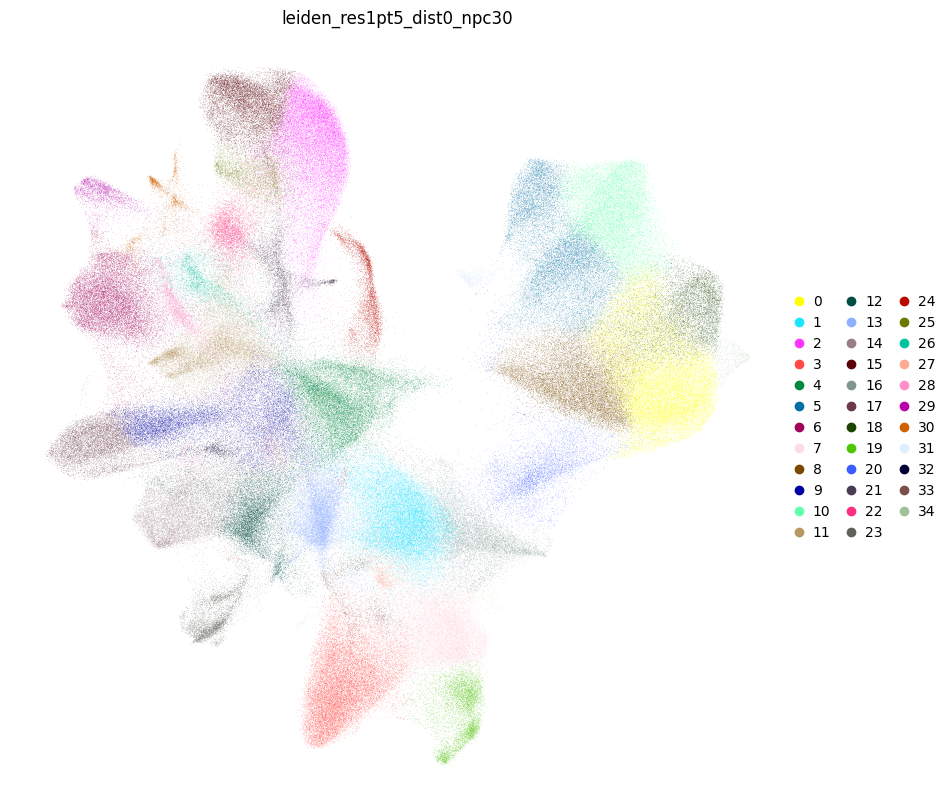

{}

In [9]:
self.plot_umap(color=col_cell_type)  # UMAP
self.plot_spatial()  # spatially-resolved plot of cluster labels
self.plot_spatial(groups=["0"])  # plot of JUST cluster 0

## Annotation

### Automated Annotation 

You can run this if you specified a file above in `file_ann` a file whose first column contains gene names and whose second column contains the cell type label associated with that gene.

Here's an example top few lines of a pre-defined marker-based annotation guide file:

| gene      | group               | bin         | bucket                 | lump       |
|-----------|---------------------|-------------|------------------------|------------|
| BEST2     | BEST2+ Goblet cell   | Goblet      | Secretory Epithelial    | Epithelial |
| ZG16      | BEST2+ Goblet cell   | Goblet      | Secretory Epithelial    | Epithelial |
| MUC4      | BEST2+ Goblet cell   | Goblet      | Secretory Epithelial    | Epithelial |
| BCAN      | Neural              | Neural      | Neural-Glia             |  Stromal          |
| TPD52L1   | Neural              | Neural      | Neural-Glia             |  Stromal          |
| RAMP1     | Neural              | Neural      | Neural-Glia             |  Stromal          |
| LINC00682 | Neural              | Neural      | Neural-Glia             |  Stromal          |
| KLRC1     | T_NK_cells          | T_NK_cells  | T Cell                  |  Lymphocyte          |
| CMC1      | T_NK_cells          | T_NK_cells  | T Cell                  |  Lymphocyte          |
| GZMK      | T_NK_cells          | T_NK_cells  | T Cell                  |  Lymphocyte          |
| MATK      | T_NK_cells          | T_NK_cells  | T Cell                  |  Lymphocyte          |
| MRGPRX2   | Mast cell           | Mast Cell   | Granulocyte             |  Myeloid          |
| TPSAB1    | Mast cell           | Mast Cell   | Granulocyte             |  Myeloid          |
| CMA1      | Mast cell           | Mast Cell   | Granulocyte             |  Myeloid          |




     Activated CD4 T  Adult Glia  B (Plasma RBC)  B Cell  BEST2+ Goblet cell  \
0               0.0         0.0             0.0     0.0                 1.0   
1               0.0         1.0             0.0     0.0                 0.0   
2               0.0         0.0             0.0     0.0                 0.0   
3               0.0         0.0             0.0     2.0                 0.0   
4               0.0         2.0             0.0     0.0                 0.0   
5               0.0         1.0             0.0     0.0                 2.0   
6               0.0         3.0             0.0     0.0                 2.0   
7               0.0         0.0             0.0     0.0                 0.0   
8               0.0         0.0             0.0     0.0                 1.0   
9               0.0         0.0             0.0     0.0                 1.0   
10              0.0         1.0             3.0     0.0                 2.0   
11              0.0         2.0             0.0 

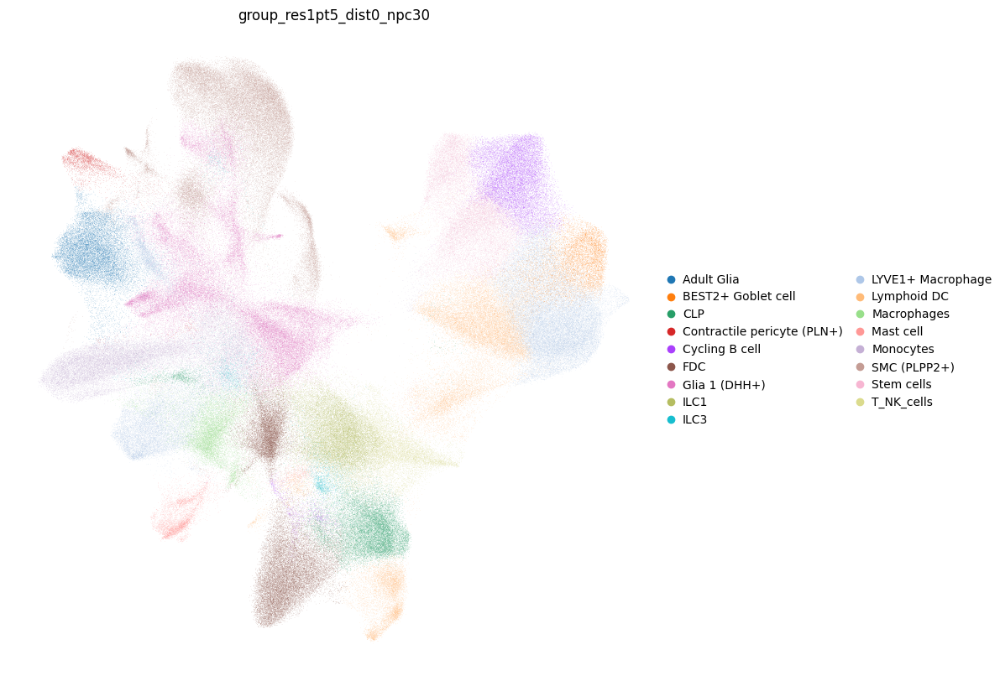

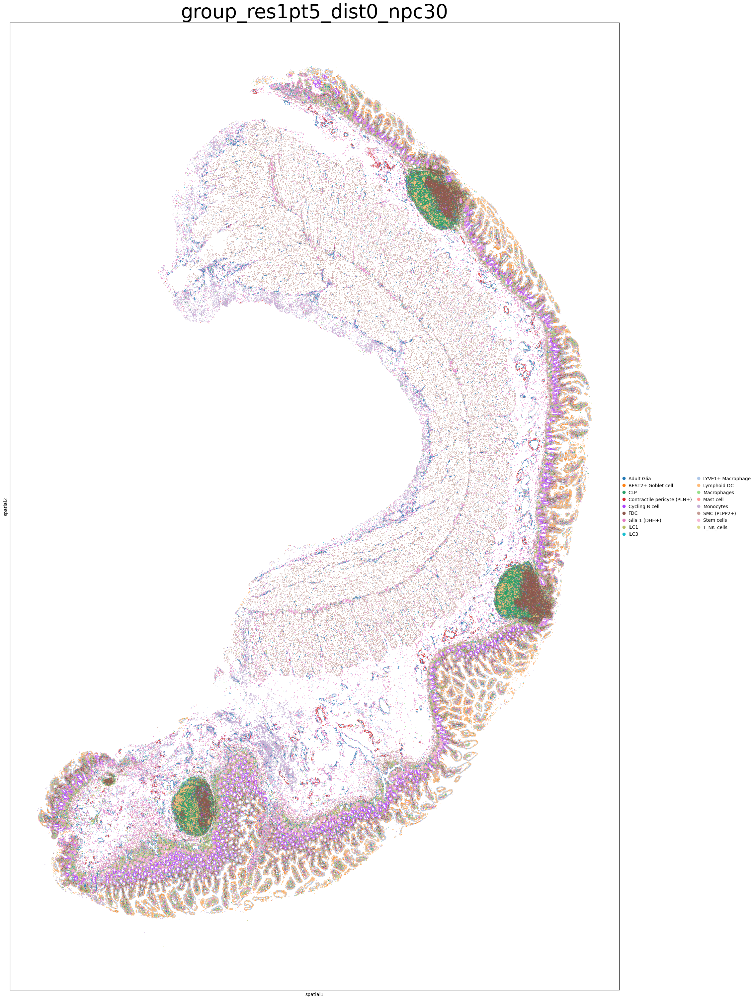

In [10]:
assign = pd.read_csv(file_ann, index_col=0)
col_annotation = f"{col_ann}_{suffix}"
_ = self.annotate_clusters(assign[[col_ann]],
                           col_cell_type=col_cell_type,
                           col_annotation=col_annotation)

### Manual Annotation

Or, you can perform manual annotation mapping each Leiden cluster to an annotation, save it into an Excel file, and then make a column using that mapping. (Alternatively, you can just manually construct a Python dictionary and use that instead of `dict(assign[col_ann])`.)

* The 1st column of the excel file should contain the library IDs (e.g., Uninflamed-50403A2) identifying the sample being annotated. 
* The 2nd column should contain the name of the `self.rna.obs` column that contains the Leiden clustering you're mapping labels to. 
* The 3rd column should contain the Leiden cluster labels. 
* You can have multiple columns after that containing whatever information you want, including cell type labels (annotations), additional information about the clusters, etc.
  * However, it's advisable that the first column be your desired cell type labels (e.g., B Cell) for each Leiden cluster. 
  * If you want to use a column other than the 4th column to create your labels (e.g., if your file contains the labels elsewhere, or if you have multiple versions of the annotations), change the code below (`col_ann = assign.columns[0]`) to `col_ann = <COLUMN NAME WITH YOUR DESIRED LABELS>`.

Here's an example of the top few lines (with certain rows in the middle cut out for space) of a manual annotation file with two versions (high and low resolution) of the annotations:

| Sample          | Clustering                  | cluster | annotation                  | bin         |
|-----------------|-----------------------------|---------|------------------------------|-------------|
| Uninflamed-50006B | leiden_res1pt5_dist0_npc30  | 0       | SMC                          | SMC         |
|                 |                             | 1       | Epithelial (TA)              | Epithelial  |
|                 |                             | 2       | Plasma (IgA/IgG)             | B Cell      |
|                 |                             | 3       | Epithelial (Enterocyte)      | Epithelial  |
|                 |                             | 4       | Epithelial (Secretory)       | Epithelial  |
|                 |                             | 5       | Stromal (Transitional 3)     | Stromal     |
|                 |                             | 6       | Endothelial                  | Endothelial |
| Stricture-50564A4 | leiden_res1pt5_dist0_npc30 | 0       | Plasma (IgA/IgG)             | B Cell      |
|                 |                             | 1       | B Cell                       | B Cell      |
|                 |                             | 2       | Epithelial (TA)              | Epithelial (TA) |
|                 |                             | 3       | Stromal (2)                  | Stromal     |


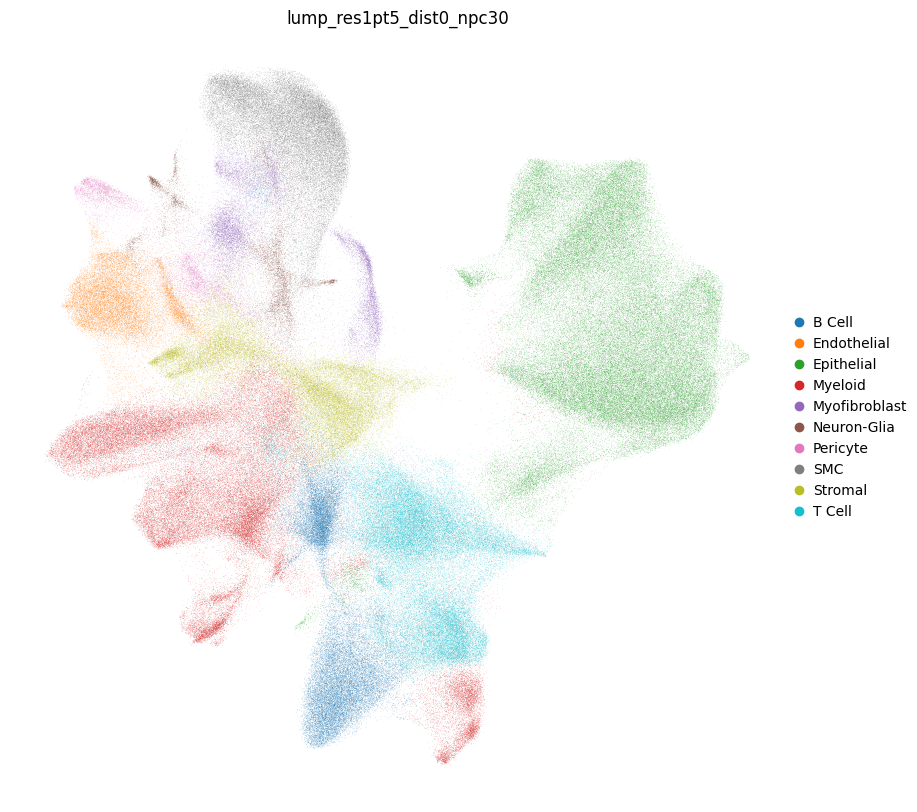

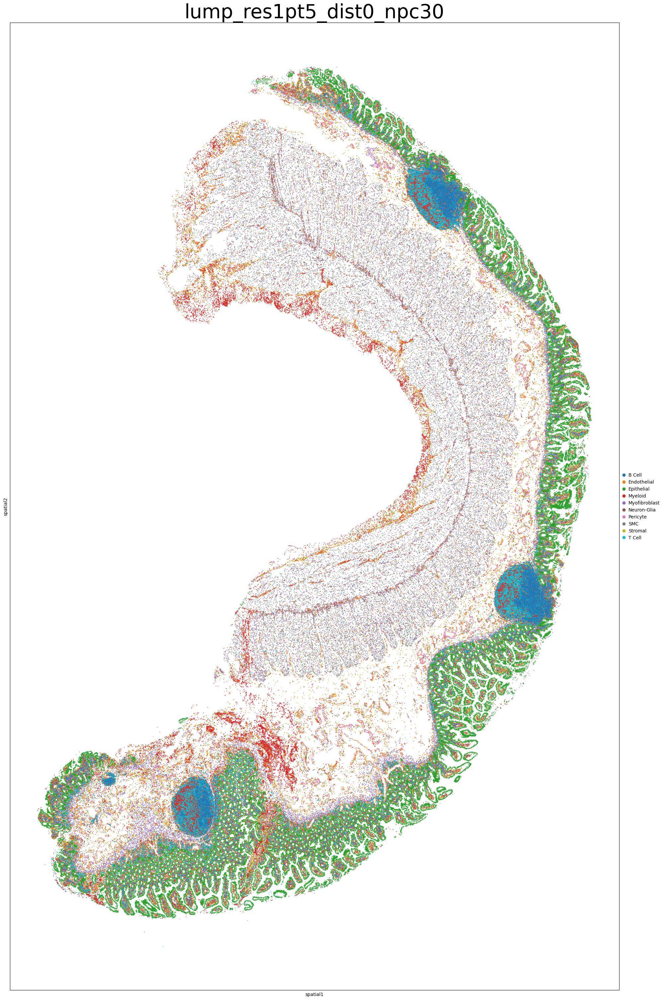

In [11]:
manual = pd.read_excel(file_a, index_col=[0, 1, 2]).loc[
    self._library_id].loc[col_cell_type]
col_annotation = f"{col_a}_{suffix}"
_ = self.annotate_clusters(dict(manual[col_a]), col_cell_type=col_cell_type,
                           col_annotation=col_annotation)

## Write Files

### Xenium Explorer-Compatible Cell ID-Cluster Mapping

In [ ]:
ct_cols = [k for k in [self._columns["col_cell_type"], col_annotation] if (
    k in self.rna.obs)]  # cell type columns (annotation &/or Leiden)
if out_dir is not None:
    for c in ct_cols:  # write Leiden clusters, then annotations if available
        self.write_clusters(os.path.join(out_dir, "explorer_files"),
                            col_cell_type=c, overwrite=False,
                            file_prefix=f"{s._library_id}__", n_top=None)

### PDFs with Cluster Localization Plots

In [ ]:
ct_cols = [k for k in [self._columns["col_cell_type"], col_annotation] if (
    k in self.rna.obs)]  # cell type columns (annotation &/or Leiden)
if out_dir is not None:
    for c in ct_cols:  # write Leiden, then annotation column
        self.plot_clusters(col_cell_type=c, out_dir=os.path.join(
            out_plot, f"{c}.pdf"), multi_pdf=True)  # PDFs of spatial plots

### Write Object

Write the object again in case, for instance, new columns were added by `self.annotate()`.

In [ ]:
if out_dir is not None and out_obj not in [None, False]:
    self.write(out_obj)  # write object

## Downstream Analyses

### Cell Type Columns & Genes of Interest

Set default cell type column to the annotations if they exist. 

Specify genes & gene categories to plot. If you don't want to have gene categories, you can change the code below to have `genes = [SOME LIST OF GENE NAMES]` and `genes_dict_colors = None` and `goi = genes`, or you can just make a dictionary as shown below with an arbitrary category name (e.g., `genes = {"Genes": [SOME LIST OF GENE NAMES]}`).

In [13]:
# Set Default Cell Type Column
col_ct = col_annotation if col_annotation in self.rna.obs else col_cell_type
self._columns["col_cell_type"] = col_ct

# Categorized Gene List Example
genes = {
    "CD Risk": ["LACC1", "LRRK2", "PTGER4", "NOD2"],
    "SnC Marker": ["CDKN2A", "CDKN1A", "TP53"],
    "Snc Fibrosis": ["PLAU", "PLAUR"],
    "SASP": ["IL4", "CXCL8", "CCL2", "NFKB1", "TGFB1"],
}   # genes of interest
genes_dict_colors = ["#FF0000", "#0000FF", "#000000",
                     "#FFFF00"]  # colors: each "key" (category) of genes_dict

# Just Flat List of Genes (No Categories)
goi = list(set(pd.unique(functools.reduce(lambda u, v: u + v, [
    genes[g] for g in genes])) if isinstance(genes, dict) else genes
            ).intersection(self.rna.var_names))  # gene list

### Quantify Expression Percentages

See the Single-Cell and Single-Cell Integrated tutorials information about quantifying gene (co-)positive cell percentages using `self.quantify_cells()`.

### Gene Expression & Cell Type Composition Plots

To change the axis title size (gene names, in this case) for `self.plot_spatial()`, pass the argument `fontsize_axis`  (e.g., `self.plot_spatial(color=["STAT1", "PTGER4", "IL4"], fontsize_axis=46)`).

In [14]:
# Which GEX Layer to Plot
layer = "scaled"  # or "counts", "log1p"; should change `vmin`/`center`/`vmax`
vmin, vmax = (-2, 2) if layer == "scaled" else (None, None)  # color scale

# Plot GEX (Spatially-Resolved)
fig_gex_sp = self.plot_spatial(color=goi + [col_ct], layer=layer)

# Suffix for File Name
pex = "_".join(re.sub("/", "", str(
    f"{self._library_id}{suffix}_{'_'.join(genes)}")).split(" ") + ".jpeg")

# Dot Plot
out_g = os.path.join(out_plot, f"dot_gex_{pex}") if out_plot else None
fig_gex_dot = cr.pl.plot_dot(
    self.rna, col_ct, genes, genes_dict_colors=genes_dict_colors,
    layer=layer, vmin=vmin, vmax=vmax, center=None, percent="right",
    title=f"{self._library_id}", out_file=outg)

# Heat Plot
out_h = os.path.join(out_plot, f"heat_gex_{pex}") if out_plot else None
fig_gex_heat = cr.pl.plot_matrix(
    self.rna, col_ct, genes, genes_dict_colors=genes_dict_colors,
    layer=layer, vmin=vmin, vmax=vmax, center=None, percent="right",
    title=f"{self._library_id}", out_file=out_h)

TypeError: can only concatenate list (not "str") to list

### Spatial Analyses

To run spatial analyses based on a different cell type column than is currently stored in `self._columns["col_cell_type"]`, specify `col_cell_type` as an argument to the method calls below where relevant (e.g., `self.calculate_centrality()`. etc.).

Interaction Matrix Results: `self.rna.uns["<col_cell_type>_interactions"]`

Centrality Results: `self.rna.uns["<col_cell_type>_centrality_scores"]`

Neighborhood Results: `self.rna.uns["<col_cell_type>_nhood_enrichment"]`

Co-Occurrence Results: `self.rna.uns["<col_cell_type>_co_occurrence"]`

SVG Results: `self.rna.uns["moranI"]`

In [ ]:
n_jobs = 8  # number of parallel jobs to use
p_suf = f"{self._library_id}_{self._columns['col_cell_type']}"  # file suffix

plot_c = os.path.join(
    out_plot, f"centrality_{p_suf}.jpeg") if out_plot else None
_, fig_central = self.calculate_centrality(
    figsize=(20, 10), n_jobs=n_jobs, out_plot=plot_c)

plot_n = os.path.join(
    out_plot, f"neighborhood_{p_suf}.jpeg") if out_plot else None
_, fig_neigh = self.calculate_neighborhood(figsize=(60, 30), out_plot=plot_n)

plot_cc = os.path.join(
    out_plot, f"cooccurrence_{p_suf}.jpeg") if out_plot else None
_, fig_cooccur = self.find_cooccurrence(
    figsize=(60, 20), n_jobs=n_jobs,
    kws_plot=dict(wspace=3), out_plot=plot_cc)

plot_svg = os.path.join(out_plot, f"svg_{p_suf}.jpeg") if out_plot else None
_ = self.find_svgs(
    genes=goi, method="moran", n_perms=10, kws_plot=dict(
        legend_fontsize="large"), figsize=(15, 15), n_jobs=n_jobs,
    title=self._library_id, out_plot=plot_svg)

if out_dir and out_obj not in [None, False]:
    print(f"Writing {out_obj}")
    self.write(out_obj)

## Other

### Impute Whole Transcriptome

Process the single-sample scRNA-seq data using `coreSCpy` (see `single_cell.ipynb`). Save it to an `h5ad` object in the `objects_scrna` sub-directory of your output directory as `<SAMPLE ID>_scrna.h5ad`.

Then use the `Tangram` wrapper in `coreSCpy` to impute the whole transcriptome readout and perform label transfer.

In [ ]:
whole_tx = cr.Omics(file_whole_tx)
ann_impute = self.impute(
    whole_tx.rna, col_cell_type="majority_voting", inplace=False)

### Crop Object by Region

Crop objects based on a Xenium Explorer lasso tool selection-derived coordinates file. (You can also pass a `shapely` `Polygon` or `MultiPolygon` object.)Th

Use the following code to save the new object to the conventional file naming/path. 

```python
sdata.tables[self._keys["key_table"]].to_h5ad(os.path.join(
    out_dir, f"objects_cropped/{coord_suffix}",
    f"{self._library_id}_{coord_suffix}.h5ad"))
```

In [ ]:
coord_suffix = "mucosa"
dir_coord = os.path.join(out_dir, "coordinates", coord_suffix)  # coordinates
sdata = self.crop(os.path.join(dir_coord, libid + f"_{coord_suffix}.csv"))

### Visium HD Example

You first have to rename the `feature_slice.h5` file because the `spatialdata-io` reader expects a dataset ID to be in that file name:
```bash
cd /mnt/cho_lab/disk2/elizabeth/data/visium-registry/analysis/spaceranger
cd sr_count_2024-08-08_1757/VIS-001_50336B-EU3/outs
mv feature_slice.h5 VIS-001_50336B-EU3_feature_slice.h5
```

Then you can load it in Python using `corescpy`.

In [ ]:
direc = str("/mnt/cho_lab/disk2/elizabeth/data/visium-registry/analysis"
            "/spaceranger/sr_count_2024-08-08_1757/VIS-001_50336B-EU3/outs")
self = cr.Spatial(direc, library_id="Inflamed-50336B", visium={
    "hd": True, "dataset_id": "VIS-001_50336B-EU3",
    "fullres_image_file": os.path.join(
        direc, "spatial/tissue_hires_image.png")}, key_table="square_002um")